In [1]:
import pandas as pd
import numpy as np
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt 

In [2]:
train= pd.read_csv('train.csv') 
train.head() 

C:\Users\miron\AppData\Local\Temp\ipykernel_29084\2348868553.py:1: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  train= pd.read_csv('train.csv')


,id,date,store_nbr,item_nbr,unit_sales,onpromotion
0,0,2013-01-01,25,103665,7.0,NaN
1,1,2013-01-01,25,105574,1.0,NaN
2,2,2013-01-01,25,105575,2.0,NaN
3,3,2013-01-01,25,108079,1.0,NaN
4,4,2013-01-01,25,108701,1.0,NaN


#### Длинна исходного датасета

In [3]:
len(train)

125497040

In [4]:
df = train[train.store_nbr==25].groupby("date").sum()['unit_sales'].reset_index()
df.head()

,date,unit_sales
0,2013-01-01,2511.619
1,2013-01-02,5316.224
2,2013-01-03,4442.913
3,2013-01-04,4844.354
4,2013-01-05,5817.526


### Колличество данных при выборе желаемого магазина

In [5]:
len(df)

1618

In [6]:
df = df.set_index(pd.DatetimeIndex(df['date'])) 
df.head() 

,date,unit_sales
date,,
2013-01-01,2013-01-01,2511.619
2013-01-02,2013-01-02,5316.224
2013-01-03,2013-01-03,4442.913
2013-01-04,2013-01-04,4844.354
2013-01-05,2013-01-05,5817.526


In [7]:
df.drop(['date'], axis = 1, inplace = True)
df.head() 

,unit_sales
date,
2013-01-01,2511.619
2013-01-02,5316.224
2013-01-03,4442.913
2013-01-04,4844.354
2013-01-05,5817.526


In [8]:
df.tail() 

,unit_sales
date,
2017-08-11,22800.841
2017-08-12,15090.753
2017-08-13,8570.598
2017-08-14,8244.854
2017-08-15,6522.788


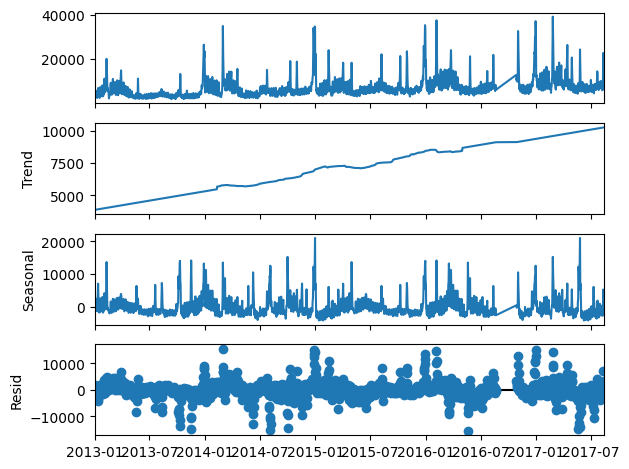

In [9]:
decomposition = seasonal_decompose(df, model='additive',extrapolate_trend='freq', period=int(len(df)/2)) 
decomposition.plot()
plt.show()

##### 2.Сколько элементов содержит шумовая часть?

In [10]:
residual_part = decomposition.resid
print(len(residual_part))

1618


In [11]:
residual_part.head()

date
2013-01-01    -185.662165
2013-01-02    1828.473280
2013-01-03    1157.915808
2013-01-04    1157.663121
2013-01-05    -666.052872
Name: resid, dtype: float64

##### 3. Сколько числовых элементов содержит шумовая часть?

In [12]:
residual_part = residual_part.dropna()
print(len(residual_part))

1618


##### 4. Сколько элементов содержит сезонная часть?

In [13]:
seasonal_part = decomposition.seasonal
print(len(seasonal_part))

1618


##### 5. Сколько числовых элементов содержит трендовая часть?

In [14]:
trend_part = decomposition.trend
print(len(trend_part))

1618


##### Выполните тест Дики-Фуллера.

In [15]:
from statsmodels.tsa.stattools import adfuller

test = adfuller(df['unit_sales'])
print ('adf: ', test[0] )
print ('p-value: ', test[1])
print ('Critical values: ', test[4])
if test[0]> test[4]['5%']: # проверка, больше ли критического полученное значение для нашего ряда 
    print ('ряд не стационарен')
else:
    print ('ряд стационарен')

adf:  -4.858992665318179
p-value:  4.188394192907804e-05
Critical values:  {'1%': -3.4344642432857992, '5%': -2.8633571955690647, '10%': -2.5677374399794197}
ряд стационарен


In [16]:
from sklearn.model_selection import TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=3,test_size=7)

In [17]:
train_test_groups = tscv.split(df.unit_sales) 
for train_index, test_index in train_test_groups:
    print("TRAIN size:", len(train_index), "TEST size:", len(test_index))

TRAIN size: 1597 TEST size: 7
TRAIN size: 1604 TEST size: 7
TRAIN size: 1611 TEST size: 7


## Расчёт факторов при помощи pandas

##### Выберите временной ряд для одного магазина
##### Постройте скользящее среднее c окном 5.

In [18]:
df['mean_sales'] = df.unit_sales.rolling(window = 5).mean()
df.head(10)

,unit_sales,mean_sales
date,,
2013-01-01,2511.619,NaN
2013-01-02,5316.224,NaN
2013-01-03,4442.913,NaN
2013-01-04,4844.354,NaN
2013-01-05,5817.526,4586.5272
2013-01-06,3201.695,4724.5424
2013-01-07,2783.978,4218.0932
2013-01-08,2884.284,3906.3674
2013-01-09,3565.639,3650.6244


##### Постройте скользящее квадратическое отклонение c окном 5. 

In [19]:
df['std_sales'] = df.unit_sales.rolling(window = 5).std( )
df.head(10)

,unit_sales,mean_sales,std_sales
date,,,
2013-01-01,2511.619,NaN,NaN
2013-01-02,5316.224,NaN,NaN
2013-01-03,4442.913,NaN,NaN
2013-01-04,4844.354,NaN,NaN
2013-01-05,5817.526,4586.5272,1268.873437
2013-01-06,3201.695,4724.5424,994.665070
2013-01-07,2783.978,4218.0932,1233.965510
2013-01-08,2884.284,3906.3674,1354.005326
2013-01-09,3565.639,3650.6244,1249.257405


##### Постройте линии Боллинджера с окном в 30


In [20]:
df['mean_boli'] = df.unit_sales.rolling(window = 30).mean()
df['std_boli'] = df.unit_sales.rolling(window = 30).std()
df['upper_bollinger'] = df['mean_boli'] + 3 * df['std_boli']
df['lower_bollinger'] = df['mean_boli'] - 3 * df['std_boli']

##### Отобразите эти оконные факторы на графике. 

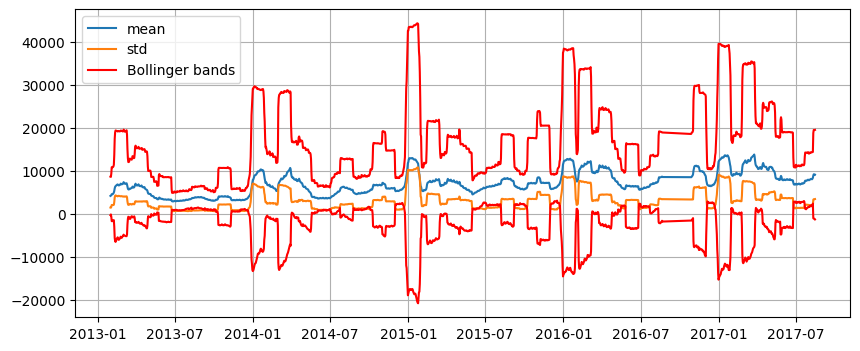

In [21]:
plt.subplots(figsize=(10, 4))
plt.plot(df.mean_boli)
plt.plot(df.std_boli)
plt.plot(df.upper_bollinger,c='r')
plt.plot(df.lower_bollinger,c='r')
plt.grid()
plt.legend(['mean','std','Bollinger bands'])
plt.show()

##### Постройте оконное среднее с окном в 10 точек.

In [22]:
df['mean_10'] = df.unit_sales.rolling(window = 10).mean()

##### Постройте экспоненциально среднее с окном в 7 точек (span=7).

In [23]:
df['EWM_7'] = df.unit_sales.ewm(span=7).mean()

##### Отобразите их на отдельном графике. 

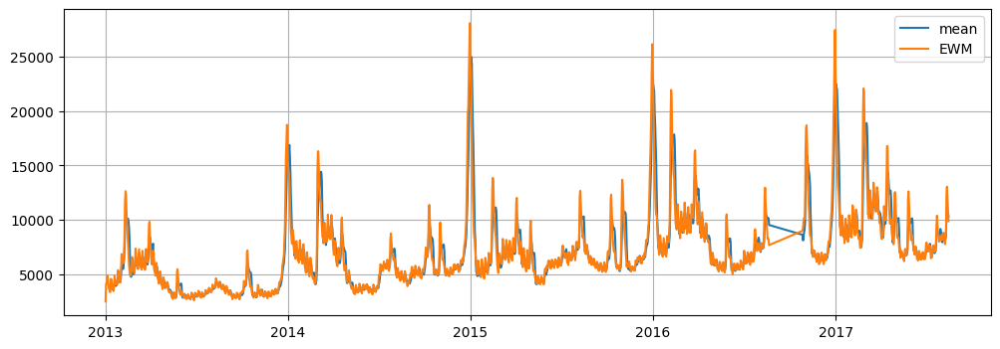

In [24]:
plt.subplots(figsize=(12, 4))
plt.plot(df['mean_10'])
plt.plot(df['EWM_7'])
plt.grid()
plt.legend(['mean','EWM'])
plt.show()

##### Напишите свою скользящую функцию, которая будет являться средним арифметическим между максимальным и минимальным значением unit_sales, используя окно 10.

In [25]:
df['minmaxmean_10'] = df.unit_sales.rolling(window = 10).apply(lambda x: (np.min(x)+np.max(x))/2)

##### Постройте скользящее среднее с окном 50 и экспоненциальное скользящее среднее с окном 10 (span=10).
##### Укажите индексы датафрейма, на которых одно скользящее пересекается с другим.
##### Для этого вычтите из одного скользящего среднего другое, возьмите знак этой разности (np.sign),
##### продифференциируйте его и оставьте только те точки, где результат дифференциирования не равен нулю.

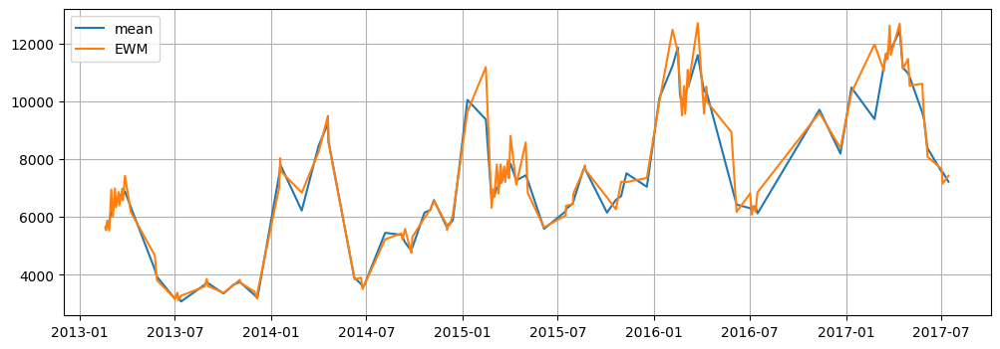

DatetimeIndex(['2013-02-19', '2013-02-20', '2013-02-22', '2013-02-26',
               '2013-03-02', '2013-03-05', '2013-03-09', '2013-03-11',
               '2013-03-16', '2013-03-17',
               ...
               '2017-04-19', '2017-04-29', '2017-05-02', '2017-05-26',
               '2017-05-30', '2017-06-03', '2017-06-05', '2017-07-02',
               '2017-07-04', '2017-07-15'],
              dtype='datetime64[ns]', name='date', length=129, freq=None)

In [26]:
df['mean_50'] = df.unit_sales.rolling(window = 50).mean()
df['EWM_10'] = df.unit_sales.ewm(span=10).mean()
df['mean_emw_cross'] = np.sign(df['mean_50']-df['EWM_10'])
cross = df[df['mean_emw_cross'].diff() != 0].dropna()
plt.subplots(figsize=(12, 4))
plt.plot(cross['mean_50'])
plt.plot(cross['EWM_10'])
plt.grid()
plt.legend(['mean','EWM'])
plt.show()
cross.index

##### Получите лаговые факторы с 7-го по 10-й предыдущих дня (лаг7, лаг8, лаг9, лаг10) и отобразите на графике. 

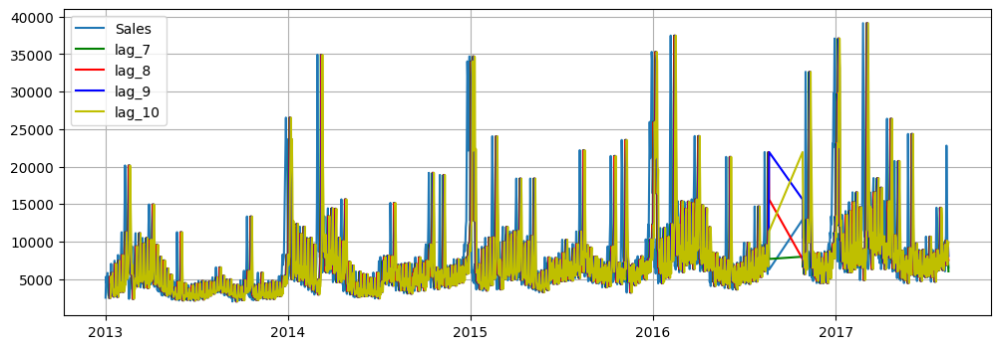

In [28]:
for i in range(7,11):
    df['lag_{}'.format(i)] = df.unit_sales.shift(i)


## визуализируем
f, ax = plt.subplots(1, 1, figsize=(12, 4))
ax.plot(df.unit_sales) ## исходные данные
ax.plot(df['lag_' + str(7)],  c='g') 
ax.plot(df['lag_' + str(8)],  c='r') 
ax.plot(df['lag_' + str(9)],  c='b') 
ax.plot(df['lag_' + str(10)],  c='y') 
ax.legend(['Sales', 'lag_7', 'lag_8', 'lag_9', 'lag_10'])
ax.grid()

## ARIMA

##### Выберите продукт с номером 103501 (item_nbr) и приведите данные к виду временного ряда с группировкой по дате и агрегацией .sum()['unit_sales']. 

In [29]:
item_set = train[train.item_nbr==103501].groupby("date").sum()['unit_sales']
item_set.head()

date
2013-01-02    185.0
2013-01-03    153.0
2013-01-04    155.0
2013-01-05    160.0
2013-01-06    173.0
Name: unit_sales, dtype: float64

##### Проведите тест Адфуллера. Стационарен ли ряд?

In [30]:
test = adfuller(item_set.values)
print ('adf: ', test[0] )
print ('p-value: ', test[1])
print ('Critical values: ', test[4])
if test[0]> test[4]['5%']: # проверка, больше ли критического полученное значение для нашего ряда 
    print ('ряд не стационарен')
else:
    print ('ряд стационарен')

adf:  -4.1544030580146165
p-value:  0.0007863083913836386
Critical values:  {'1%': -3.4344462031760283, '5%': -2.8633492329988335, '10%': -2.5677331999518147}
ряд стационарен


##### Постройте прогноз методом скользящего среднего с окном 6. Посчитайте метрики MSE, MAE, MAPE.

(6,) (6,)
mean_squared_error 287.087962962963
mean_absolute_error 13.416666666666666
mean_absolute_percentage_error 0.17213844967435177


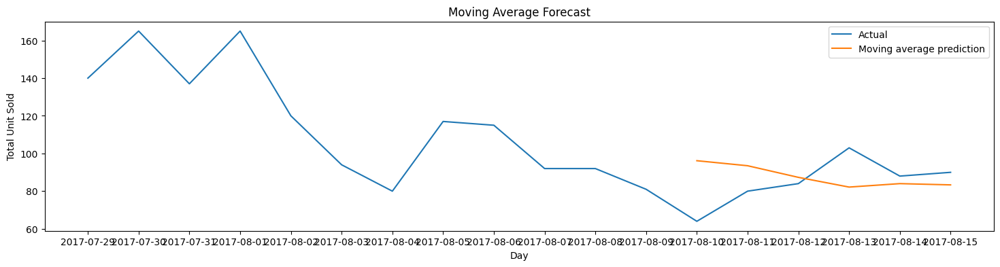

In [31]:

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error

def moving_average_forecast(series, window_size):
    forecast = []
    for time in range(len(series) - window_size):
        forecast.append(series[time:time + window_size].mean())
    return np.array(forecast)
moving_average_days = 6

shown_train_size = moving_average_days * 3
moving_avg = moving_average_forecast(item_set,moving_average_days)
moving_avg = pd.Series(moving_avg, index = item_set[moving_average_days:].index)

print(moving_avg[-moving_average_days:].shape,item_set[-moving_average_days:].shape)

print("mean_squared_error",mean_squared_error(item_set.values[-moving_average_days:], moving_avg[-moving_average_days:]))
print("mean_absolute_error",mean_absolute_error(item_set.values[-moving_average_days:], moving_avg[-moving_average_days:]))
print("mean_absolute_percentage_error",mean_absolute_percentage_error(item_set.values[-moving_average_days:], moving_avg[-moving_average_days:]))

plt.figure( figsize=(18, 4))
plt.plot(item_set[- shown_train_size:], label="Actual")
plt.plot(moving_avg[-moving_average_days:], label="Moving average prediction")
plt.ylabel("Total Unit Sold")
plt.xlabel("Day")
plt.title("Moving Average Forecast")
plt.legend(loc="upper right")

##### Сделайте лаги с 1 по 6. 

In [32]:

pred_df = pd.DataFrame()
pred_df["Original Values"]  = item_set
pred_df["shift1"] = pred_df["Original Values"].shift()
pred_df["shift2"] = pred_df["shift1"].shift()
pred_df["shift3"] = pred_df["shift2"].shift()
pred_df["shift4"] = pred_df["shift3"].shift()
pred_df["shift5"] = pred_df["shift4"].shift()
pred_df["shift6"] = pred_df["shift5"].shift()
pred_df.dropna(inplace=True)
pred_df

,Original Values,shift1,shift2,shift3,shift4,shift5,shift6
date,,,,,,,
2013-01-08,103.0,98.0,173.0,160.0,155.0,153.0,185.0
2013-01-09,71.0,103.0,98.0,173.0,160.0,155.0,153.0
2013-01-10,83.0,71.0,103.0,98.0,173.0,160.0,155.0
2013-01-11,91.0,83.0,71.0,103.0,98.0,173.0,160.0
2013-01-12,118.0,91.0,83.0,71.0,103.0,98.0,173.0
...,...,...,...,...,...,...,...
2017-08-11,80.0,64.0,81.0,92.0,92.0,115.0,117.0
2017-08-12,84.0,80.0,64.0,81.0,92.0,92.0,115.0
2017-08-13,103.0,84.0,80.0,64.0,81.0,92.0,92.0


##### Отложите 1-2 последних дня в тестовую выборку для совершения предсказания.

In [33]:
predict_size = 4 #отложил больше для визуального удобства
x_train, y_train = pred_df[:-predict_size].drop(["Original Values"], axis =1), pred_df[:-predict_size]["Original Values"]
x_test, y_test  = pred_df[-predict_size:].drop(["Original Values"], axis =1), pred_df[-predict_size:]["Original Values"]

##### Сделайте прогноз линейной регрессией, посчитайте значения метрик MSE, MAE, MAPE. 

[ 0.64655913 -0.09540461 -0.00448825 -0.00134633 -0.07275951  0.31705042]
21.232204151820156
mean_squared_error 133.051820427725
mean_absolute_error 10.235624623932114
mean_absolute_percentage_error 0.11249901681643584


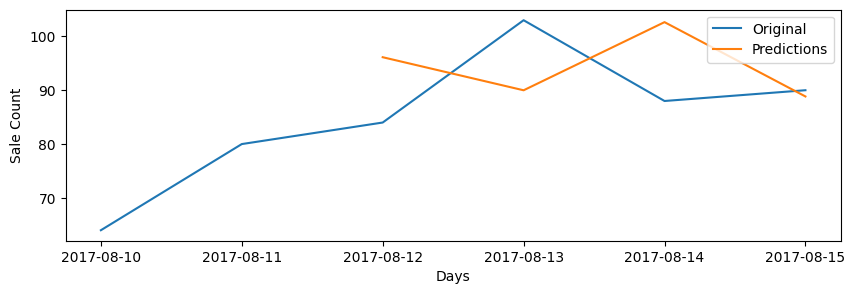

In [34]:
from sklearn.linear_model import LinearRegression
reg = LinearRegression().fit(x_train, y_train)
print(reg.coef_)
print(reg.intercept_)
ar_predictions = pd.Series(reg.predict(x_test), index=x_test.index)


plt.figure(figsize=(10,3))
plt.plot(pd.concat([y_train, y_test], axis = 0)[-6:], label = "Original" )
plt.plot(ar_predictions ,label = "Predictions")
plt.xlabel("Days")
plt.ylabel("Sale Count")

print("mean_squared_error",mean_squared_error(y_test, ar_predictions))
print("mean_absolute_error",mean_absolute_error(y_test, ar_predictions))
print("mean_absolute_percentage_error",mean_absolute_percentage_error(y_test, ar_predictions))

plt.legend(loc="upper right")

##### Определите p и q

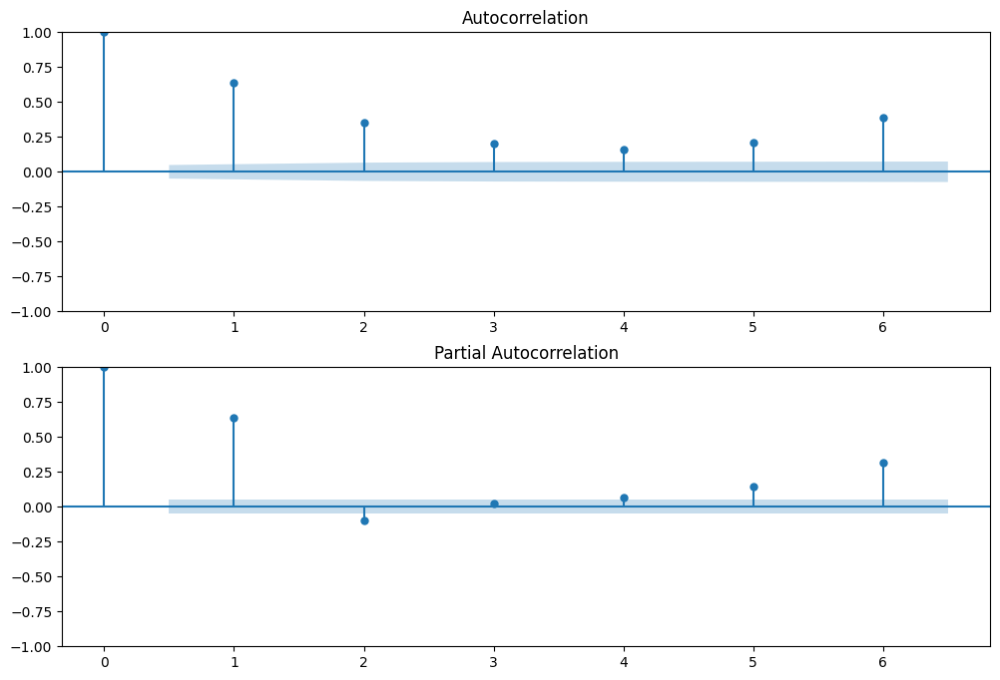

In [35]:
import statsmodels.api as sm
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(item_set.values.squeeze(), lags=6, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(item_set , lags=6, ax=ax2)

После изучения коррелограммы PACF можно сделать вывод, что p = 6, т.к. на ней все лаги сильно отличны от нуля.
По коррелограмме ACF можно предположить, что q = 6, т.к. на лаг 6 значении функций резко возрастает. Итак, когда известны все параметры можно построить модель.

In [36]:
from statsmodels.tsa.arima.model import ARIMA
model = ARIMA(y_train.values.reshape(-1), order=(6,0,6))

C:\Users\miron\AppData\Local\Programs\Python\Python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\miron\AppData\Local\Programs\Python\Python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\miron\AppData\Local\Programs\Python\Python39\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


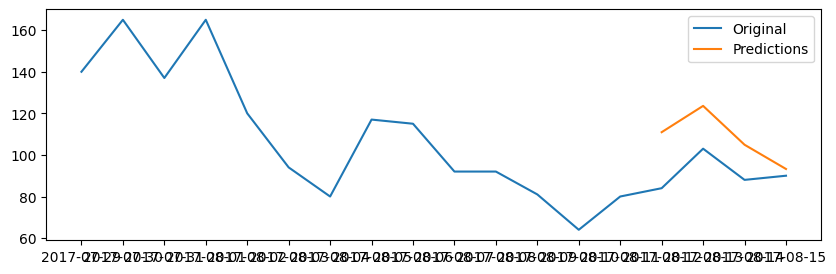

In [37]:
from statsmodels.graphics.tsaplots import plot_predict

train_size = len(y_train)
test_size = predict_size
arima_predictions = model.fit().predict(start=train_size,end=train_size+test_size -1,  dynamic=False)

plt.figure(figsize=(10,3))
plt.plot(pd.concat([y_train, y_test], axis = 0)[-shown_train_size:], label = "Original" )
plt.plot(pd.Series(arima_predictions, index=y_test.index) ,label = "Predictions")
plt.legend(loc="upper right")

In [38]:
print("mean_squared_error",mean_squared_error(y_test, arima_predictions))
print("mean_absolute_error",mean_absolute_error(y_test, arima_predictions))
print("mean_absolute_percentage_error",mean_absolute_percentage_error(y_test, arima_predictions))

mean_squared_error 361.311223378491
mean_absolute_error 16.913914742064506
mean_absolute_percentage_error 0.18712631803693142


Вывод: 
Наилучшие результаты показала линейная регрессия, ARIMA же смотря на графики лучше остальных предсказывала тенденцию

## FPProphet

In [39]:
for_prophet = pd.DataFrame()
for_prophet = train.groupby("date")['unit_sales'].sum()

In [40]:
for_prophet

date
2013-01-01      2511.619
2013-01-02    496092.418
2013-01-03    361429.231
2013-01-04    354459.677
2013-01-05    477350.121
                 ...    
2017-08-11    826373.722
2017-08-12    792630.535
2017-08-13    865639.677
2017-08-14    760922.406
2017-08-15    762661.936
Name: unit_sales, Length: 1684, dtype: float64

##### Приведите данные train.csv к виду временного ряда, сгруппированного по дате, с агрегирующей функцией sum() для столбца unit_sales. У вас должен получиться временной ряд с двумя столбцами: дата и sum_unit_sales. 

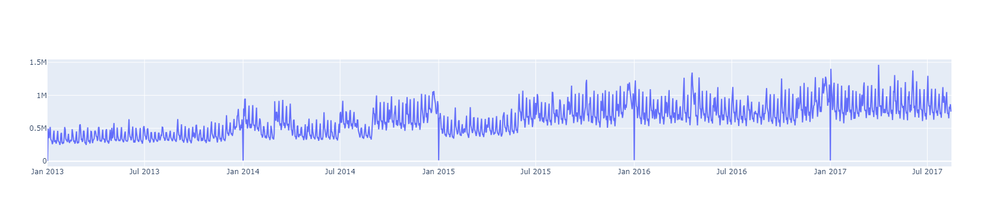

In [41]:
import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode()
py.iplot([go.Scatter(
    x=for_prophet.index,
    y=for_prophet
)])


Можно увидеть некоторое влиянние сезонности, особенно заметен сильный спад продаж первого января, вероятно большинство магазинов попросту не работают в этот день,
подъем ежедневных продаж в декабре и более мелкие пред-событийные ежегодные скачки продаж.

##### Попробуйте выполнить предсказание пророком (prophet) на год вперёд (periods=365). Отобразите на графике. Посчитайте RSME.

In [42]:
for_prophet = pd.DataFrame(for_prophet).reset_index()
for_prophet.columns = ['ds', 'y']
for_prophet

,ds,y
0,2013-01-01,2511.619
1,2013-01-02,496092.418
2,2013-01-03,361429.231
3,2013-01-04,354459.677
4,2013-01-05,477350.121
...,...,...
1679,2017-08-11,826373.722
1680,2017-08-12,792630.535
1681,2017-08-13,865639.677
1682,2017-08-14,760922.406


In [43]:
from prophet import Prophet
m = Prophet()
m.fit(for_prophet)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)
forecast

20:12:41 - cmdstanpy - INFO - Chain [1] start processing
20:12:42 - cmdstanpy - INFO - Chain [1] done processing


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2013-01-01,334339.557973,245759.848344,5.151076e+05,334339.557973,3.343396e+05,43479.595164,43479.595164,43479.595164,-68157.942659,-68157.942659,-68157.942659,111637.537823,111637.537823,111637.537823,0.0,0.0,0.0,3.778192e+05
1,2013-01-02,334709.425078,249082.110083,5.262965e+05,334709.425078,3.347094e+05,55521.983079,55521.983079,55521.983079,-44199.968067,-44199.968067,-44199.968067,99721.951145,99721.951145,99721.951145,0.0,0.0,0.0,3.902314e+05
2,2013-01-03,335079.292184,164933.205486,4.266287e+05,335079.292184,3.350793e+05,-44091.993238,-44091.993238,-44091.993238,-131878.686822,-131878.686822,-131878.686822,87786.693584,87786.693584,87786.693584,0.0,0.0,0.0,2.909873e+05
3,2013-01-04,335449.159289,221829.084344,4.934555e+05,335449.159289,3.354492e+05,18980.476919,18980.476919,18980.476919,-57029.549952,-57029.549952,-57029.549952,76010.026870,76010.026870,76010.026870,0.0,0.0,0.0,3.544296e+05
4,2013-01-05,335819.026395,402301.685347,6.676307e+05,335819.026395,3.358190e+05,198563.733324,198563.733324,198563.733324,134003.618265,134003.618265,134003.618265,64560.115060,64560.115060,64560.115060,0.0,0.0,0.0,5.343828e+05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2044,2018-08-11,992940.440847,907490.471098,1.198640e+06,941781.184314,1.044820e+06,62507.821270,62507.821270,62507.821270,134003.618264,134003.618264,134003.618264,-71495.796994,-71495.796994,-71495.796994,0.0,0.0,0.0,1.055448e+06
2045,2018-08-12,993209.047680,962075.152195,1.260181e+06,941879.623366,1.045278e+06,116406.034755,116406.034755,116406.034755,188401.650111,188401.650111,188401.650111,-71995.615356,-71995.615356,-71995.615356,0.0,0.0,0.0,1.109615e+06
2046,2018-08-13,993477.654513,747598.862382,1.056517e+06,941978.062418,1.045736e+06,-92974.081792,-92974.081792,-92974.081792,-21139.120876,-21139.120876,-21139.120876,-71834.960916,-71834.960916,-71834.960916,0.0,0.0,0.0,9.005036e+05
2047,2018-08-14,993746.261346,705094.064133,1.015369e+06,942042.466790,1.046195e+06,-139173.462331,-139173.462331,-139173.462331,-68157.942659,-68157.942659,-68157.942659,-71015.519672,-71015.519672,-71015.519672,0.0,0.0,0.0,8.545728e+05


C:\Users\miron\AppData\Local\Programs\Python\Python39\lib\site-packages\_plotly_utils\basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



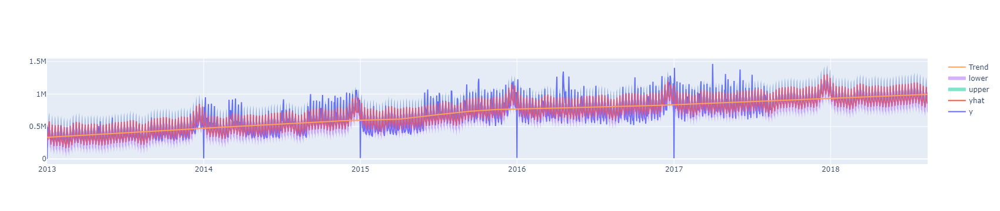

In [44]:
py.iplot([
    go.Scatter(x=for_prophet['ds'], y=for_prophet['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

##### Вычислим среднеквадратичную ошибку.

In [45]:
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-for_prophet['y'])**2)) )

RMSE: 107824.776579


##### Поэкспериментируйте с коэффициентом changepoint_prior_scale (переберите 3-5 значений, больше/меньше 0,5) и посмотрите, как изменится тренд.
##### В какую сторону необходимо двигать коэффициент? Тренд переобучен или недообучен?

20:12:42 - cmdstanpy - INFO - Chain [1] start processing
20:12:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\miron\AppData\Local\Programs\Python\Python39\lib\site-packages\_plotly_utils\basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



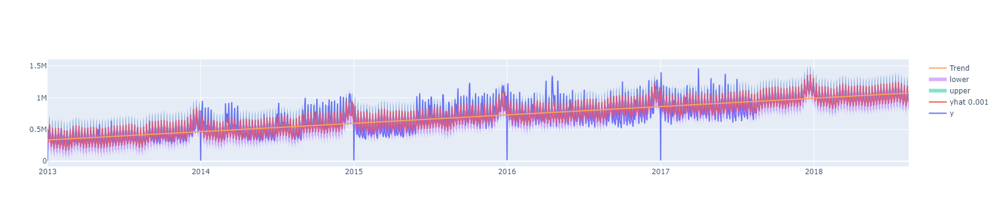

20:12:43 - cmdstanpy - INFO - Chain [1] start processing


RMSE: 112343.245160


20:12:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\miron\AppData\Local\Programs\Python\Python39\lib\site-packages\_plotly_utils\basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



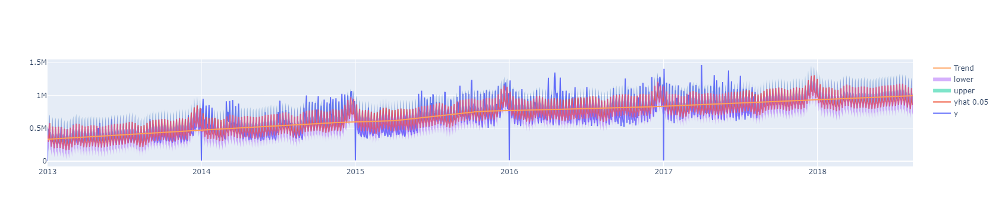

20:12:43 - cmdstanpy - INFO - Chain [1] start processing


RMSE: 107824.776579


20:12:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\miron\AppData\Local\Programs\Python\Python39\lib\site-packages\_plotly_utils\basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



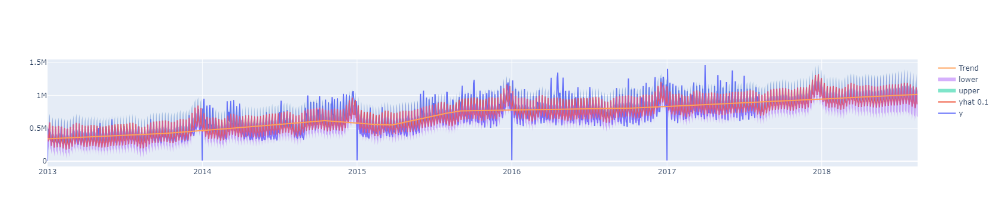

20:12:44 - cmdstanpy - INFO - Chain [1] start processing


RMSE: 103983.355109


20:12:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\miron\AppData\Local\Programs\Python\Python39\lib\site-packages\_plotly_utils\basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



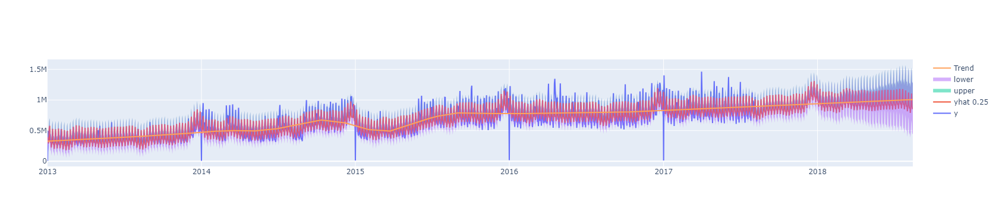

20:12:44 - cmdstanpy - INFO - Chain [1] start processing


RMSE: 100224.189417


20:12:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\miron\AppData\Local\Programs\Python\Python39\lib\site-packages\_plotly_utils\basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



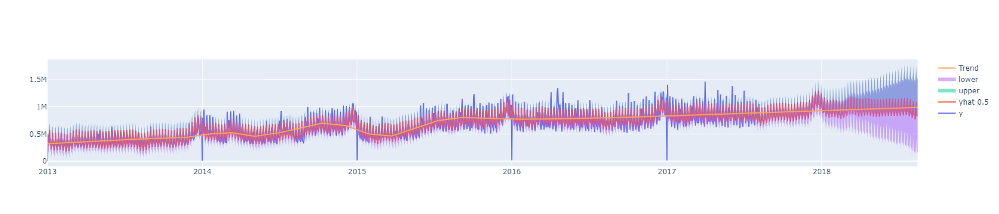

20:12:45 - cmdstanpy - INFO - Chain [1] start processing


RMSE: 98583.807728


20:12:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\miron\AppData\Local\Programs\Python\Python39\lib\site-packages\_plotly_utils\basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



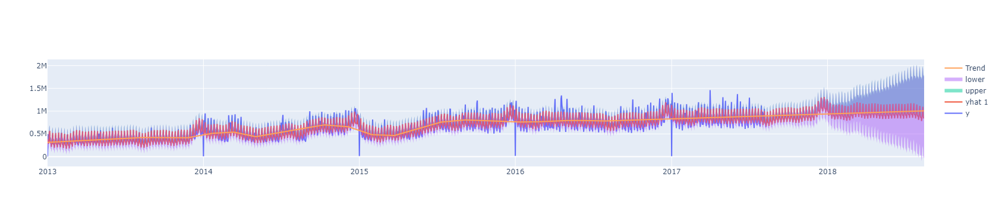

20:12:46 - cmdstanpy - INFO - Chain [1] start processing


RMSE: 97820.968820


20:12:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\miron\AppData\Local\Programs\Python\Python39\lib\site-packages\_plotly_utils\basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



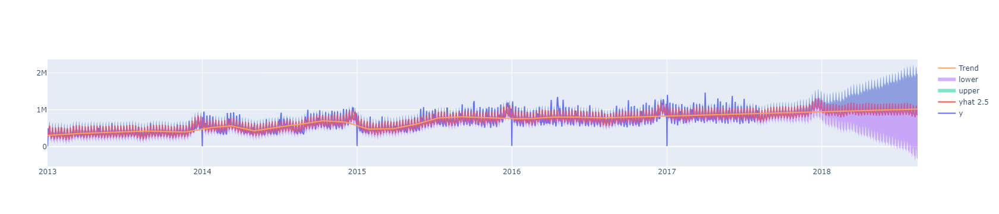

RMSE: 97465.620814


In [46]:
for i in [0.001,0.05,0.1,0.25,0.5,1,2.5]:
    m = Prophet(changepoint_prior_scale=i)
    m.fit(for_prophet)
    future = m.make_future_dataframe(periods=365)
    forecast = m.predict(future)
    py.iplot([
        go.Scatter(x=for_prophet['ds'], y=for_prophet['y'], name='y'),
        go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat '+str(i)),
        go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
        go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
        go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
    ])
    print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-for_prophet['y'])**2)) )



 Можно увидеть, что при повышении гибкости улучшается и RMSE. Тренд при взятии меньшего значения очевидно недообучен, тогда как последние значения и их результаты имеют признаки переобучения. 
 Наиболее оптимальным вариантом мне видится значение 0.1.

20:12:46 - cmdstanpy - INFO - Chain [1] start processing
20:12:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\miron\AppData\Local\Programs\Python\Python39\lib\site-packages\_plotly_utils\basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



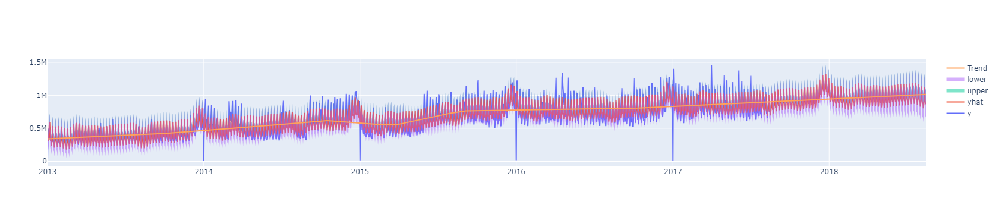

RMSE: 103983.355109


In [47]:
#Наиболее подходящим мне кажется вариант с 0.1
m = Prophet(changepoint_prior_scale=0.1)
m.fit(for_prophet)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)
py.iplot([
    go.Scatter(x=for_prophet['ds'], y=for_prophet['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat '),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-for_prophet['y'])**2)) )


##### Добавьте в модель месячную сезонность

20:12:47 - cmdstanpy - INFO - Chain [1] start processing
20:12:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\miron\AppData\Local\Programs\Python\Python39\lib\site-packages\_plotly_utils\basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



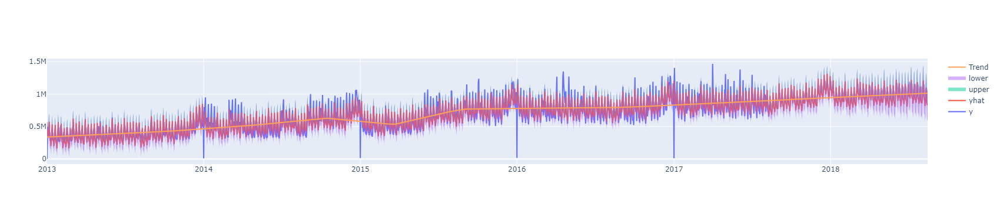

RMSE: 97224.862168


In [48]:
m = Prophet(changepoint_prior_scale=0.1)
m.add_seasonality(name='monthly', period=30.5, fourier_order=5)
m.fit(for_prophet)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)
py.iplot([
    go.Scatter(x=for_prophet['ds'], y=for_prophet['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat '),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-for_prophet['y'])**2)) )


При имплементации месячной сезонности можно наблюдать улучшение модели и уменьшение ошибки.

##### Улучшите модель добавлением данных о праздниках.

In [49]:
df_holidays = pd.read_csv('holidays_events.csv')
df_holidays.head()

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [50]:
holidays = df_holidays[df_holidays['transferred'] == False][['description', 'date']]
holidays.columns = ['holiday', 'ds']
holidays.head()

,holiday,ds
0,Fundacion de Manta,2012-03-02
1,Provincializacion de Cotopaxi,2012-04-01
2,Fundacion de Cuenca,2012-04-12
3,Cantonizacion de Libertad,2012-04-14
4,Cantonizacion de Riobamba,2012-04-21


In [51]:
m = Prophet(changepoint_prior_scale=0.1, holidays=holidays)
m.add_seasonality(name='monthly', period=30.5, fourier_order=5)
m.fit(for_prophet)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

20:12:48 - cmdstanpy - INFO - Chain [1] start processing
20:12:48 - cmdstanpy - INFO - Chain [1] done processing


##### Вычислим среднеквадратичную ошибку.

RMSE: 79243.429821


C:\Users\miron\AppData\Local\Programs\Python\Python39\lib\site-packages\_plotly_utils\basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



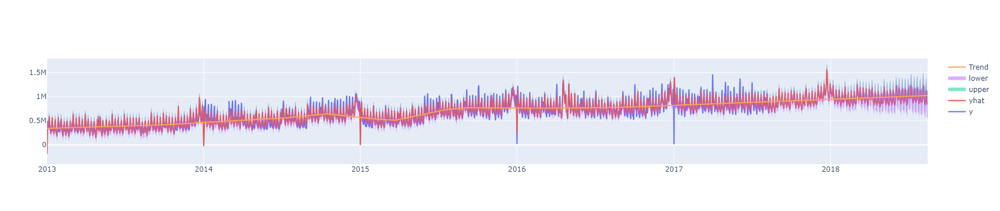

In [52]:

print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-for_prophet['y'])**2)) )
py.iplot([
    go.Scatter(x=for_prophet['ds'], y=for_prophet['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

##### Вывод
Нам относительно точно удалось спрогнозировать взлет продаж в декабре, но модель игнорирует сильный спад в продажах первого января, а так же повышение продаж в апреле и мае и первых месяцах осени.
f.

### Xgboost и CatBoost
##### Правильным образом разбейте данные на train и test.

In [53]:
boost_df = pd.DataFrame(train.groupby("date").sum()['unit_sales'])
boost_df.tail()

,unit_sales
date,
2017-08-11,826373.722
2017-08-12,792630.535
2017-08-13,865639.677
2017-08-14,760922.406
2017-08-15,762661.936


<Axes: title={'center': 'Unit Sales'}, xlabel='date'>

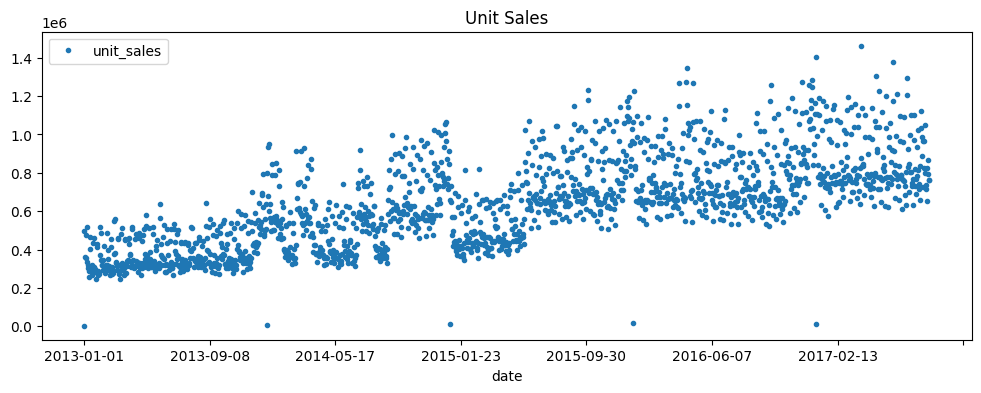

In [54]:
boost_df.plot(style='.', figsize=(12,4), title='Unit Sales')

Возьмем для тестов данные с начала 2017го года. Изначально хотелось взять 365 дней от последней записи чтобы проверить предсказания за весь год, но от этого сильно страдало качество моделей, так же слишком большой массив данных удалялся с применением лагов.

<Axes: title={'center': 'Train/test ratio'}, xlabel='date'>

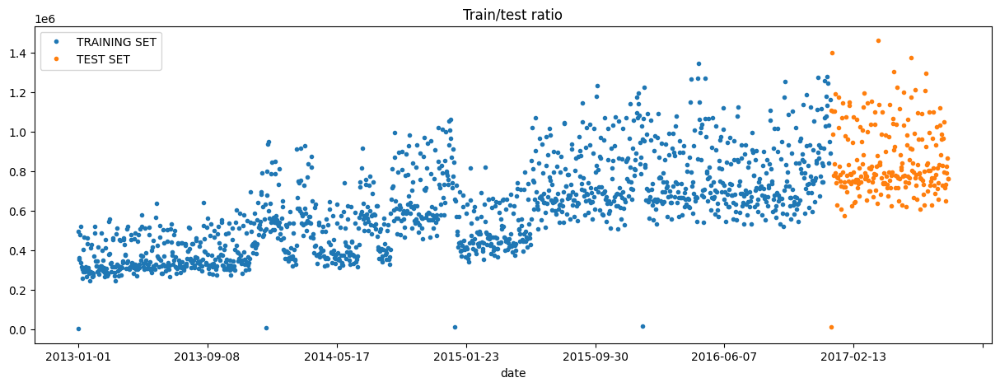

In [55]:
split_date = '2016-12-30'
boost_train = boost_df.loc[boost_df.index <= split_date].copy()
boost_test = boost_df.loc[boost_df.index > split_date].copy()
boost_train.rename(columns={'unit_sales': 'TRAINING SET'}) \
    .join(boost_test.rename(columns={'unit_sales': 'TEST SET'}), how='outer') \
    .plot(figsize=(15,5), title='Train/test ratio', style='.')

##### Создайте временные признаки от datetime.

In [56]:
def create_features(df, label=None):
    df['date'] = pd.to_datetime(df.index, format='%Y-%m-%d')
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.isocalendar().week
    
    X = df[['dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
    if label:
        y = df[label]
        return X, y
    return X

In [57]:
X_train, y_train = create_features(boost_train, label='unit_sales')
X_test, y_test = create_features(boost_test, label='unit_sales')
X_train.sample(5)

,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
date,,,,,,,
2014-09-23,1,3,9,2014,266,23,39
2016-03-27,6,1,3,2016,87,27,12
2015-12-28,0,4,12,2015,362,28,53
2016-11-19,5,4,11,2016,324,19,46
2015-08-23,6,3,8,2015,235,23,34


##### Инициализируйте модели XGBoost и CatBoost.
##### Обучите модели.


In [58]:
import xgboost as xgb
from catboost import CatBoostRegressor
from xgboost import plot_importance, plot_tree

reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)
cbr = CatBoostRegressor(n_estimators=1000)
cbr.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)

C:\Users\miron\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:885: UserWarning:

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



##### Отобразите важность признаков

<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

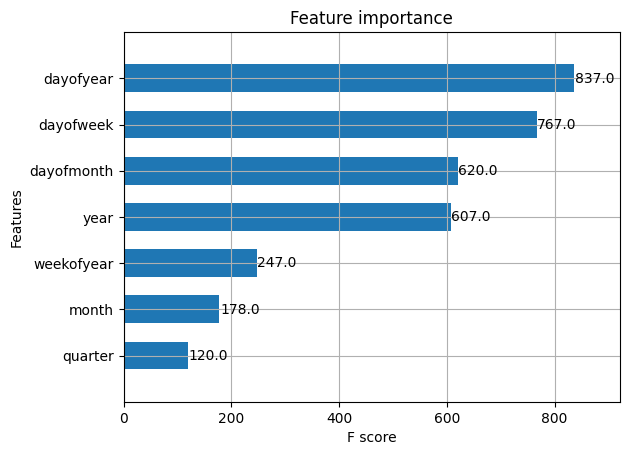

In [59]:
plot_importance(reg, height=0.6)

Инересено что именно день недели и день года несут в себе наибольшую важность. Особенно интересен день недели, возможно магазины в нашей выборке не всегда работают по выходным или имеют ряд скидок в определенные дни недели. Кварталы же в свою очедь считаются маловажными.

##### Сделайте прогноз и отобразите результат на графике.

In [60]:
boost_test['Sales_Prediction'] = reg.predict(X_test)
boost_test['Sales_Prediction_catboost'] = cbr.predict(X_test)
boost_all = pd.concat([boost_test, boost_train], sort=False)

<Axes: xlabel='date'>

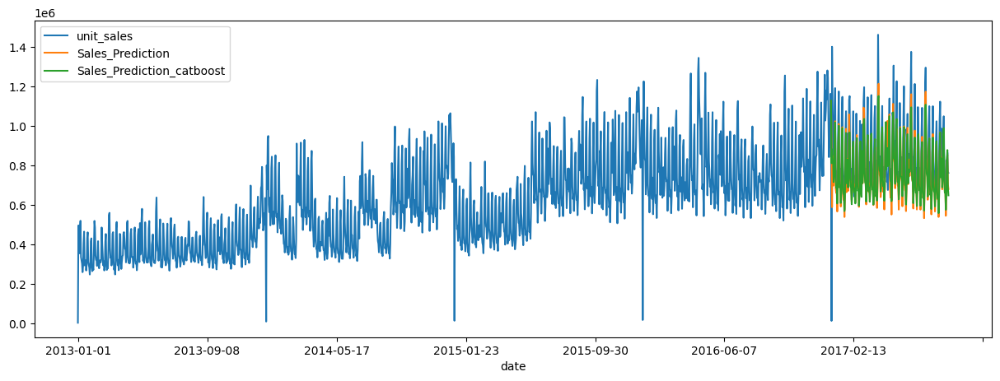

In [61]:
boost_all[['unit_sales','Sales_Prediction','Sales_Prediction_catboost']].sort_index().plot(figsize=(15, 5))

#### xgboost

In [62]:
from sklearn.metrics import mean_absolute_percentage_error

def mertics_print(y_true,y_pred):
    print('MAE:',mean_absolute_error(y_true=y_true, y_pred=y_pred))
    print('MSE:',mean_squared_error(y_true=y_true, y_pred=y_pred))
    print('MAPE:',mean_absolute_percentage_error(y_true=y_true, y_pred=y_pred))

mertics_print(boost_test['unit_sales'],boost_test['Sales_Prediction'])

MAE: 104523.52562280702
MSE: 19802428268.502537
MAPE: 0.44697690712459753


#### catboost

In [63]:
mertics_print(boost_test['unit_sales'],boost_test['Sales_Prediction_catboost'])

MAE: 98504.36875618294
MSE: 16643932519.875237
MAPE: 0.3951961993418309


##### Модели не сильно отличаются друг от друга, посмотрим как будут менятся метрики при добавлении дополнительных признаков

##### Добавьте данные о праздничных днях.

In [64]:
import holidays
ec_holidays = holidays.EC()

X_train['Date'] = X_train.index
X_train['Holiday'] = X_train['Date'].apply(lambda x: 1 if x in ec_holidays else 0)
X_train = X_train.drop('Date', axis = 'columns')

X_test['Date'] = X_test.index
X_test['Holiday'] = X_test['Date'].apply(lambda x: 1 if x in ec_holidays else 0)
X_test = X_test.drop('Date', axis = 'columns')

C:\Users\miron\AppData\Local\Temp\ipykernel_29084\2460238454.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\miron\AppData\Local\Temp\ipykernel_29084\2460238454.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\miron\AppData\Local\Temp\ipykernel_29084\2460238454.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

In [65]:
reg2 = xgb.XGBRegressor(n_estimators=1000)
reg2.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)
cbr2 = CatBoostRegressor(n_estimators=1000)
cbr2.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)

C:\Users\miron\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:885: UserWarning:

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



<Axes: xlabel='date'>

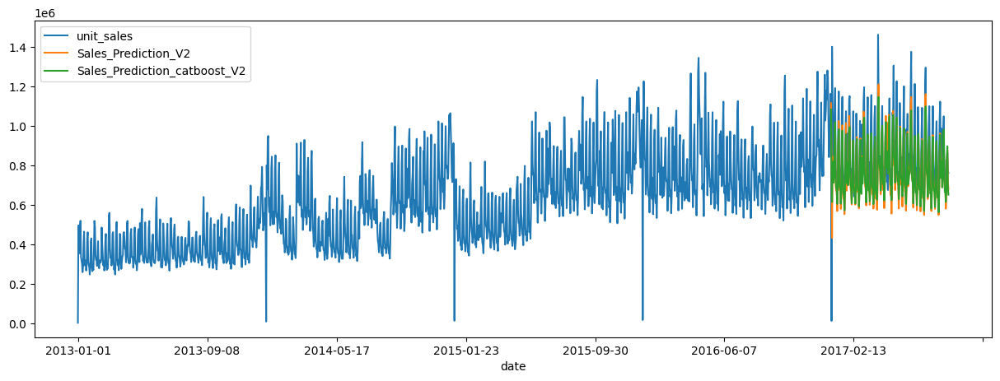

In [66]:
boost_test['Sales_Prediction_V2'] = reg2.predict(X_test)
boost_test['Sales_Prediction_catboost_V2'] = cbr2.predict(X_test)
boost_all = pd.concat([boost_test, boost_train], sort=False)

boost_all[['unit_sales','Sales_Prediction_V2','Sales_Prediction_catboost_V2']].sort_index().plot(figsize=(15, 5))

<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

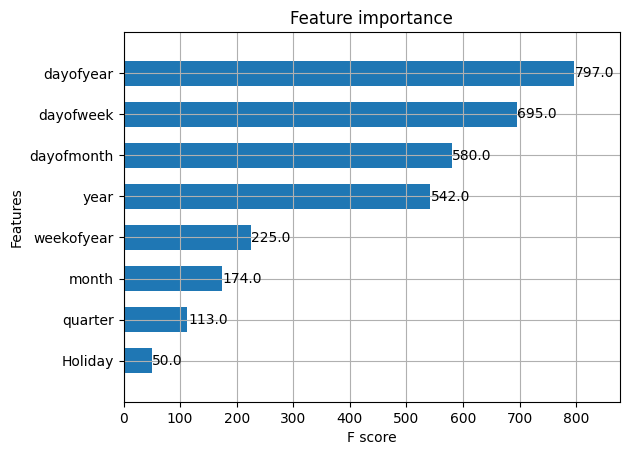

In [67]:
plot_importance(reg2, height=0.6)

In [68]:
mertics_print(boost_test['unit_sales'],boost_test['Sales_Prediction_V2'])

MAE: 105136.67851973684
MSE: 20629805895.1401
MAPE: 0.42756902170310984


In [69]:
mertics_print(boost_test['unit_sales'],boost_test['Sales_Prediction_catboost_V2'])

MAE: 98729.37841323727
MSE: 18093714230.22483
MAPE: 0.39048181729588555


Праздники слабо повлияли на результат, слегка улучшились результаты у xboost и ухудшились у catboost

##### Добавьте лаги. 

In [70]:
train_df=X_train
train_df['sales'] = y_train

test_df = X_test
test_df['sales'] = y_test

glued_df = pd.concat([train_df,test_df], sort=False)
glued_df

,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear,Holiday,sales
date,,,,,,,,,
2013-01-01,1,1,1,2013,1,1,1,1,2511.619
2013-01-02,2,1,1,2013,2,2,1,0,496092.418
2013-01-03,3,1,1,2013,3,3,1,0,361429.231
2013-01-04,4,1,1,2013,4,4,1,0,354459.677
2013-01-05,5,1,1,2013,5,5,1,0,477350.121
...,...,...,...,...,...,...,...,...,...
2017-08-11,4,3,8,2017,223,11,32,1,826373.722
2017-08-12,5,3,8,2017,224,12,32,0,792630.535
2017-08-13,6,3,8,2017,225,13,32,0,865639.677


In [71]:
X_test.shape[0]

228

In [73]:
glued_df["shift229"] = glued_df["sales"].shift(229)
glued_df["shift230"] = glued_df["shift229"].shift()
glued_df["shift231"] = glued_df["shift230"].shift()
glued_df["shift232"] = glued_df["shift231"].shift()
glued_df["shift233"] = glued_df["shift232"].shift()
glued_df["shift234"] = glued_df["shift233"].shift()
glued_df.dropna(inplace=True)
glued_df

,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear,Holiday,sales,shift229,shift230,shift231,shift232,shift233,shift234
date,,,,,,,,,,,,,,,
2013-08-23,4,3,8,2013,235,23,34,0,331906.369,519695.401,477350.121,354459.677,361429.231,496092.418,2511.619
2013-08-24,5,3,8,2013,236,24,34,0,420576.155,336122.801,519695.401,477350.121,354459.677,361429.231,496092.418
2013-08-25,6,3,8,2013,237,25,34,0,443694.094,318347.778,336122.801,519695.401,477350.121,354459.677,361429.231
2013-08-26,0,3,8,2013,238,26,35,0,347159.641,302530.809,318347.778,336122.801,519695.401,477350.121,354459.677
2013-08-27,1,3,8,2013,239,27,35,0,319688.219,258982.003,302530.809,318347.778,336122.801,519695.401,477350.121
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,4,3,8,2017,223,11,32,1,826373.722,1246837.843,1282145.517,1135849.392,1181307.327,1078323.690,1028242.823
2017-08-12,5,3,8,2017,224,12,32,0,792630.535,1032770.749,1246837.843,1282145.517,1135849.392,1181307.327,1078323.690
2017-08-13,6,3,8,2017,225,13,32,0,865639.677,842474.490,1032770.749,1246837.843,1282145.517,1135849.392,1181307.327


In [74]:
shift_train = glued_df.loc[glued_df.index <= split_date].copy()
shift_test = glued_df.loc[glued_df.index > split_date].copy()

In [75]:
X_train = shift_train.drop('sales', axis = 'columns')
y_train = shift_train['sales']

X_test = shift_test.drop('sales', axis = 'columns')
y_test = shift_test['sales']


X_test.head(3)

,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear,Holiday,shift229,shift230,shift231,shift232,shift233,shift234
date,,,,,,,,,,,,,,
2016-12-31,5,4,12,2016,366,31,52,0,1070331.667,921606.521,666833.900,603394.207,727543.463,693010.487
2017-01-01,6,1,1,2017,1,1,52,1,746119.687,1070331.667,921606.521,666833.900,603394.207,727543.463
2017-01-02,0,1,1,2017,2,2,1,1,661929.839,746119.687,1070331.667,921606.521,666833.900,603394.207


In [76]:
reg3 = xgb.XGBRegressor(n_estimators=1000)
reg3.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)
cbr3 = CatBoostRegressor(n_estimators=1000)
cbr3.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)

C:\Users\miron\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:885: UserWarning:

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

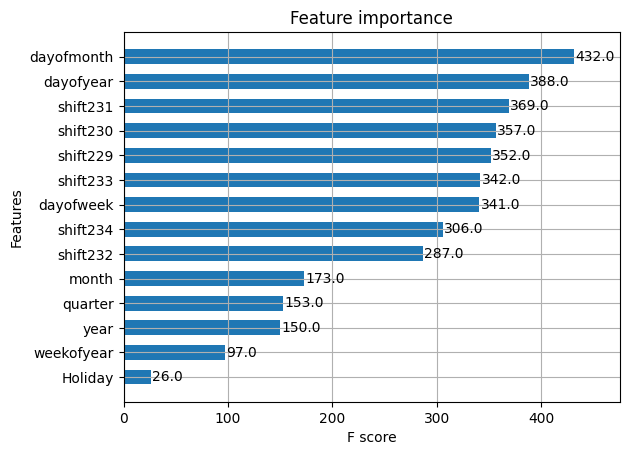

In [77]:
plot_importance(reg3, height=0.6)

#### Значения лагов с прошлого когда сильно влияют на результаты, посмотрим приведет ли это к улучшению

In [78]:
boost_test['Sales_Prediction_V3'] = reg3.predict(X_test)
boost_test['Sales_Prediction_catboost_V3'] = cbr3.predict(X_test)
boost_all = pd.concat([boost_test, boost_train], sort=False)

In [79]:
mertics_print(boost_test['unit_sales'],boost_test['Sales_Prediction_V3'])

MAE: 104269.12056578948
MSE: 21753304674.29243
MAPE: 0.5056342336190189


In [80]:
mertics_print(boost_test['unit_sales'],boost_test['Sales_Prediction_catboost_V3'])

MAE: 95931.38887076067
MSE: 16096136391.815472
MAPE: 0.4000945204320767


##### При добавлении лагов, и праздников мы добились наилучших результатов по метрикам MAE и MSE используя catboost. Добавление новых признаков, а так же вероятно изменение размера тестовой выборки и колличества лагов, благополучно сложится на качестве модели и улучшат ее точность.